In [0]:
!pip install pandas numpy optuna imbalanced-learn xgboost 

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from imblearn.over_sampling import SMOTE, ADASYN
import optuna
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv("https://github.com/roniwahyu/Indonesian-Digital-Banks-Dataset2025/raw/refs/heads/main/07_indobert_filtered_90K_Stemmed.csv")
display(df)

review_id,bank_name,content_preprocessed,score,sentiment,content_length,word_count,at,content_stemmed
a53f0cf0-a3f4-4e42-b44d-a2519150b725,AlloBank,mulai jt bisa punya deposito simple aman gak perlu pikir panjang,5,Positive,77,13,2025-12-05 13:06:28,mulai jt bisa punya deposito simple aman gak perlu pikir panjang
6a9c5d18-8710-40e7-be4a-7d1cd4339a2e,AlloBank,nabungnya low effort tapi hasilnya keliatan cocok buat orang gampang lupa nabung,5,Positive,87,13,2025-12-05 13:01:21,nabungnya low effort tapi hasil liat cocok buat orang gampang lupa nabung
862b5675-eb70-4788-b224-ce789685a41a,AlloBank,gue jadi lebih tenang punya cadangan cocok buat dana keluarga,5,Positive,63,10,2025-12-05 12:47:13,gue jadi lebih tenang punya cadang cocok buat dana keluarga
8965a30e-e4ad-46c5-91ea-44840bd9233e,AlloBank,nggak ribet sama sekali poin plus buat gue cara paling enak mulai nabung,5,Positive,84,15,2025-12-05 12:42:45,nggak ribet sama sekali poin plus buat gue cara paling enak mulai nabung
30d88226-d255-466d-b461-440873558289,AlloBank,aplikasinya ringan transfernya lancar kalau jam gak sibuk,5,Positive,59,8,2025-12-05 12:39:35,aplikasi ringan transfer lancar kalau jam gak sibuk
a5993355-7909-4550-ab3f-13c34b5629cb,AlloBank,paylaternya beneran ngebantu pas lagi banyak kebutuhan bisa cicil sd bulan,5,Positive,79,12,2025-12-05 12:33:29,paylaternya beneran ngebantu pas lagi banyak butuh bisa cicil sd bulan
088ccadd-8286-4967-ad8c-971bc5c8e56a,AlloBank,allo grow salah satu bikin gue pake allo bank karena budgeting jadi fun bukan beban,5,Positive,90,16,2025-12-05 12:33:01,allo grow salah satu bikin gue pake allo bank karena budgeting jadi fun bukan beban
3a867de1-aad1-4b94-8c6e-96f8b658bed3,AlloBank,gue bikin satu deposito khusus buat keperluan mendadak soalnya sini bisa ditarik kalo butuh terus gak ada potongan lagi,5,Positive,123,20,2025-12-05 12:18:29,gue bikin satu deposito khusus buat perlu dadak soal sini bisa tarik kalo butuh terus gak ada potong lagi
a7d71b7a-05e1-42c3-ae2c-2033f11467d7,AlloBank,walaupun suka ngelag tetap jadi andalan gue sering pake buat makan siang apalagi pas akhir bulan,5,Positive,98,16,2025-12-05 12:09:51,walaupun suka ngelag tetap jadi andal gue sering pake buat makan siang apalagi pas akhir bulan
2dd27641-14c5-4bd0-9b97-07c85a6466b7,AlloBank,cicilan paylaternya ringan gak bikin panik limitnya bantu pas akhir bulan,5,Positive,76,11,2025-12-05 12:02:33,cicil paylaternya ringan gak bikin panik limit bantu pas akhir bulan


In [0]:
# Remove rows where 'content_stemmed' is null
df = df[df['content_stemmed'].notnull()]
display(df)

review_id,bank_name,content_preprocessed,score,sentiment,content_length,word_count,at,content_stemmed
a53f0cf0-a3f4-4e42-b44d-a2519150b725,AlloBank,mulai jt bisa punya deposito simple aman gak perlu pikir panjang,5,Positive,77,13,2025-12-05 13:06:28,mulai jt bisa punya deposito simple aman gak perlu pikir panjang
6a9c5d18-8710-40e7-be4a-7d1cd4339a2e,AlloBank,nabungnya low effort tapi hasilnya keliatan cocok buat orang gampang lupa nabung,5,Positive,87,13,2025-12-05 13:01:21,nabungnya low effort tapi hasil liat cocok buat orang gampang lupa nabung
862b5675-eb70-4788-b224-ce789685a41a,AlloBank,gue jadi lebih tenang punya cadangan cocok buat dana keluarga,5,Positive,63,10,2025-12-05 12:47:13,gue jadi lebih tenang punya cadang cocok buat dana keluarga
8965a30e-e4ad-46c5-91ea-44840bd9233e,AlloBank,nggak ribet sama sekali poin plus buat gue cara paling enak mulai nabung,5,Positive,84,15,2025-12-05 12:42:45,nggak ribet sama sekali poin plus buat gue cara paling enak mulai nabung
30d88226-d255-466d-b461-440873558289,AlloBank,aplikasinya ringan transfernya lancar kalau jam gak sibuk,5,Positive,59,8,2025-12-05 12:39:35,aplikasi ringan transfer lancar kalau jam gak sibuk
a5993355-7909-4550-ab3f-13c34b5629cb,AlloBank,paylaternya beneran ngebantu pas lagi banyak kebutuhan bisa cicil sd bulan,5,Positive,79,12,2025-12-05 12:33:29,paylaternya beneran ngebantu pas lagi banyak butuh bisa cicil sd bulan
088ccadd-8286-4967-ad8c-971bc5c8e56a,AlloBank,allo grow salah satu bikin gue pake allo bank karena budgeting jadi fun bukan beban,5,Positive,90,16,2025-12-05 12:33:01,allo grow salah satu bikin gue pake allo bank karena budgeting jadi fun bukan beban
3a867de1-aad1-4b94-8c6e-96f8b658bed3,AlloBank,gue bikin satu deposito khusus buat keperluan mendadak soalnya sini bisa ditarik kalo butuh terus gak ada potongan lagi,5,Positive,123,20,2025-12-05 12:18:29,gue bikin satu deposito khusus buat perlu dadak soal sini bisa tarik kalo butuh terus gak ada potong lagi
a7d71b7a-05e1-42c3-ae2c-2033f11467d7,AlloBank,walaupun suka ngelag tetap jadi andalan gue sering pake buat makan siang apalagi pas akhir bulan,5,Positive,98,16,2025-12-05 12:09:51,walaupun suka ngelag tetap jadi andal gue sering pake buat makan siang apalagi pas akhir bulan
2dd27641-14c5-4bd0-9b97-07c85a6466b7,AlloBank,cicilan paylaternya ringan gak bikin panik limitnya bantu pas akhir bulan,5,Positive,76,11,2025-12-05 12:02:33,cicil paylaternya ringan gak bikin panik limit bantu pas akhir bulan


## EDA

<class 'pandas.core.frame.DataFrame'>
Index: 95865 entries, 0 to 96417
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   review_id             95865 non-null  object
 1   bank_name             95865 non-null  object
 2   content_preprocessed  95865 non-null  object
 3   score                 95865 non-null  int64 
 4   sentiment             95865 non-null  object
 5   content_length        95865 non-null  int64 
 6   word_count            95865 non-null  int64 
 7   at                    95865 non-null  object
 8   content_stemmed       95865 non-null  object
dtypes: int64(3), object(6)
memory usage: 7.3+ MB
None
                                   review_id  ... content_stemmed
count                                  95865  ...           95865
unique                                 95865  ...           74715
top     a53f0cf0-a3f4-4e42-b44d-a2519150b725  ...          mantap
freq                        

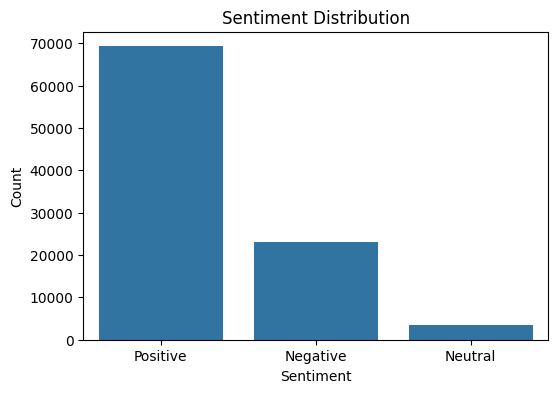

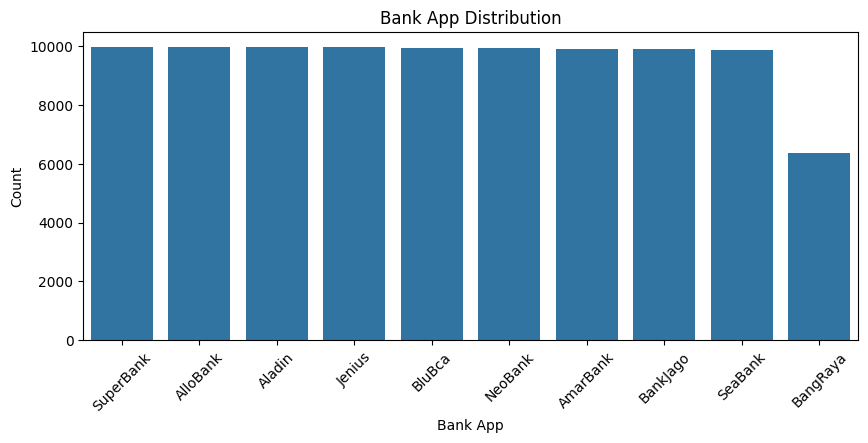

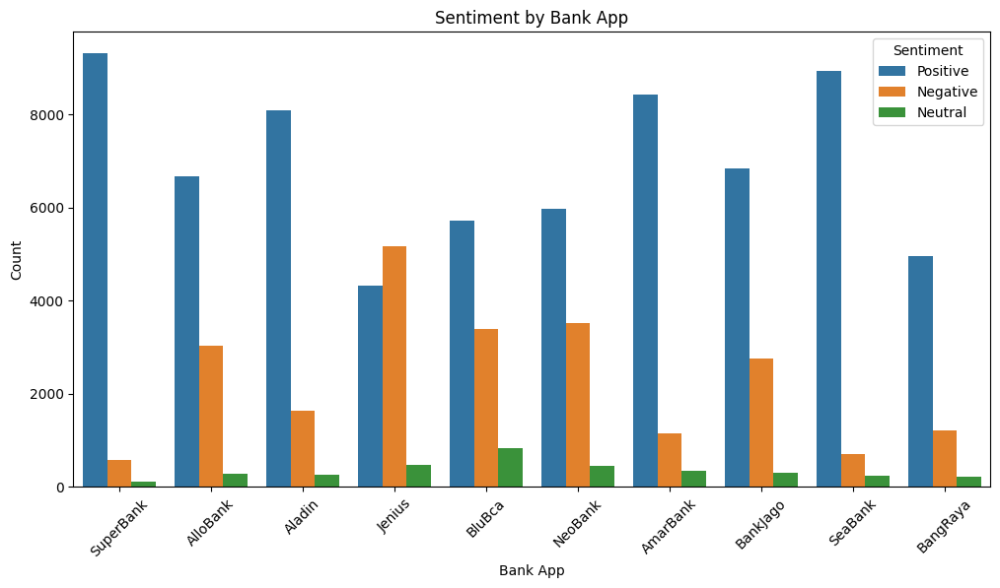

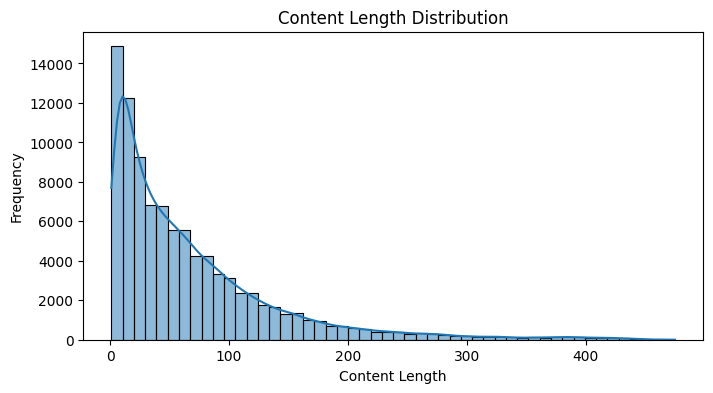

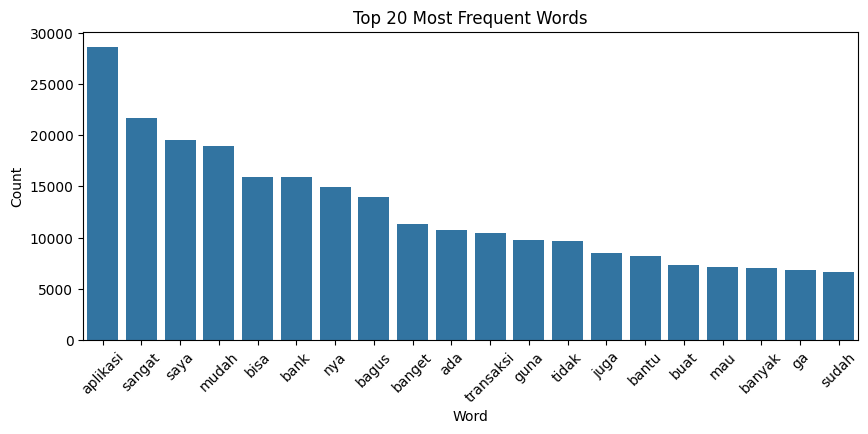

In [0]:
# Basic EDA
print(df.info())
print(df.describe(include='all'))
print(df.isnull().sum())

# Sentiment distribution
plt.figure(figsize=(6,4))
sns.countplot(
    x='sentiment',
    data=df
)
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

# Bank app distribution
plt.figure(figsize=(10,4))
sns.countplot(
    x='bank_name',
    data=df,
    order=df['bank_name'].value_counts().index
)
plt.title('Bank App Distribution')
plt.xlabel('Bank App')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Sentiment by bank app
plt.figure(figsize=(12,6))
sns.countplot(
    x='bank_name',
    hue='sentiment',
    data=df,
    order=df['bank_name'].value_counts().index
)
plt.title('Sentiment by Bank App')
plt.xlabel('Bank App')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Sentiment')
plt.show()

# Content length distribution
df['content_length'] = df['content_stemmed'].str.len()
plt.figure(figsize=(8,4))
sns.histplot(
    df['content_length'],
    bins=50,
    kde=True
)
plt.title('Content Length Distribution')
plt.xlabel('Content Length')
plt.ylabel('Frequency')
plt.show()

# Top 20 most frequent words in content_stemmed
from collections import Counter
all_words = ' '.join(df['content_stemmed']).split()
word_freq = Counter(all_words)
top_words = pd.DataFrame(
    word_freq.most_common(20),
    columns=['word', 'count']
)
plt.figure(figsize=(10,4))
sns.barplot(
    x='word',
    y='count',
    data=top_words
)
plt.title('Top 20 Most Frequent Words')
plt.xlabel('Word')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [0]:
def balance_data(df, group_cols):
    min_count = df.groupby(group_cols).size().min()
    return (
        df.groupby(group_cols, group_keys=False)
        .apply(lambda x: x.sample(n=min(len(x), min_count), random_state=42))
    )
    

def extract_tfidf_features(texts, ngram_range=(2,3)):
    tfidf = TfidfVectorizer(ngram_range=ngram_range)
    return tfidf.fit_transform(texts), tfidf

def oversample(X, y, method='SMOTE'):
    if method == 'SMOTE':
        sampler = SMOTE(random_state=42)
    elif method == 'ADASYN':
        sampler = ADASYN(random_state=42)
    else:
        raise ValueError("method must be 'SMOTE' or 'ADASYN'")
    return sampler.fit_resample(X, y)

In [0]:

def optimize_rf(X, y):
    rf = RandomForestClassifier(random_state=42)
    rf_params = {
        'n_estimators': [100, 200, 300],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10]
    }
    rf_search = RandomizedSearchCV(rf, rf_params, n_iter=10, cv=3, scoring='roc_auc', random_state=42)
    rf_search.fit(X, y)
    return rf_search.best_estimator_

In [0]:
def balance_data(df, group_cols):
    min_count = df.groupby(group_cols).size().min()
    return (
        df.groupby(group_cols, group_keys=False)
        .apply(lambda x: x.sample(n=min(len(x), min_count), random_state=42))
    )

def extract_tfidf_features(texts, ngram_range=(2,3)):
    tfidf = TfidfVectorizer(ngram_range=ngram_range)
    return tfidf.fit_transform(texts), tfidf

def oversample(X, y, method='SMOTE'):
    if method == 'SMOTE':
        sampler = SMOTE(random_state=42)
    elif method == 'ADASYN':
        sampler = ADASYN(random_state=42)
    else:
        raise ValueError("method must be 'SMOTE' or 'ADASYN'")
    return sampler.fit_resample(X, y)

def optimize_rf(X, y):
    rf = RandomForestClassifier(random_state=42)
    rf_params = {
        'n_estimators': [100, 200, 300],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10]
    }
    rf_search = RandomizedSearchCV(rf, rf_params, n_iter=10, cv=3, scoring='roc_auc', random_state=42)
    rf_search.fit(X, y)
    return rf_search.best_estimator_

def optimize_xgb(X_train, y_train, X_test, y_test):
    def xgb_objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 20),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'random_state': 42,
            'use_label_encoder': False,
            'eval_metric': 'logloss'
        }
        xgb = XGBClassifier(**params)
        xgb.fit(X_train, y_train)
        preds = xgb.predict_proba(X_test)[:,1]
        return roc_auc_score(y_test, preds)
    study = optuna.create_study(direction='maximize')
    study.optimize(xgb_objective, n_trials=10)
    best_params = study.best_params
    return XGBClassifier(**best_params, random_state=42, use_label_encoder=False, eval_metric='logloss')

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:,1]
    cm = confusion_matrix(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    report = classification_report(y_test, y_pred, output_dict=True)
    return cm, auc, report, y_pred, y_proba

def plot_and_save_confusion_matrix(cm, model_name, sampler, train_ratio):
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix {model_name} {sampler} {train_ratio}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.savefig(f'confusion_matrix_{model_name}_{sampler}_{train_ratio}.png')
    plt.close()

def plot_and_save_roc_curve(y_test, y_proba, auc, model_name, sampler, train_ratio):
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.figure(figsize=(6,4))
    plt.plot(fpr, tpr, label=f'AUC={auc:.2f}')
    plt.plot([0,1],[0,1],'--',color='gray')
    plt.title(f'ROC Curve {model_name} {sampler} {train_ratio}')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.savefig(f'roc_curve_{model_name}_{sampler}_{train_ratio}.png')
    plt.close()

In [0]:
from sklearn.preprocessing import LabelEncoder

def comparative_hpo_workflow(df, ratios=[(0.7, 0.3), (0.75, 0.25), (0.65, 0.35)]):
    df = df[['bank_name', 'sentiment', 'content_stemmed']].drop_duplicates()
    display(df)
    balanced_df = balance_data(df, ['bank_name', 'sentiment'])
    display(balanced_df)
    X_tfidf, tfidf = extract_tfidf_features(balanced_df['content_stemmed'])
    y = balanced_df['sentiment']
    # Encode sentiment labels to integers
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    results = []
    for train_ratio, test_ratio in ratios:
        X_train, X_test, y_train, y_test = train_test_split(
            X_tfidf,
            y_encoded,
            train_size=train_ratio,
            random_state=42,
            stratify=y_encoded
        )
        for sampler in ['SMOTE', 'ADASYN']:
            X_res, y_res = oversample(X_train, y_train, method=sampler)
            rf_best = optimize_rf(X_res, y_res)
            xgb_best = optimize_xgb(X_res, y_res, X_test, y_test)
            for model_name, model in [('RandomForest', rf_best), ('XGBoost', xgb_best)]:
                cm, auc, report, y_pred, y_proba = evaluate_model(model, X_test, y_test)
                results.append({
                    'train_ratio': train_ratio,
                    'sampler': sampler,
                    'model': model_name,
                    'confusion_matrix': cm,
                    'roc_auc': auc,
                    'classification_report': report
                })
                plot_and_save_confusion_matrix(cm, model_name, sampler, train_ratio)
                plot_and_save_roc_curve(y_test, y_proba, auc, model_name, sampler, train_ratio)
    results_df = pd.DataFrame([{
        'train_ratio': r['train_ratio'],
        'sampler': r['sampler'],
        'model': r['model'],
        'roc_auc': r['roc_auc'],
        'precision': r['classification_report']['weighted avg']['precision'],
        'recall': r['classification_report']['weighted avg']['recall'],
        'f1-score': r['classification_report']['weighted avg']['f1-score']
    } for r in results])
    results_df.to_csv('results_comparative_hpo.csv', index=False)
    with open('results_comparative_hpo.md', 'w') as f:
        f.write(results_df.to_markdown())
    display(results_df)

# Run the workflow
comparative_hpo_workflow(df)

bank_name,sentiment,content_stemmed
AlloBank,Positive,mulai jt bisa punya deposito simple aman gak perlu pikir panjang
AlloBank,Positive,nabungnya low effort tapi hasil liat cocok buat orang gampang lupa nabung
AlloBank,Positive,gue jadi lebih tenang punya cadang cocok buat dana keluarga
AlloBank,Positive,nggak ribet sama sekali poin plus buat gue cara paling enak mulai nabung
AlloBank,Positive,aplikasi ringan transfer lancar kalau jam gak sibuk
AlloBank,Positive,paylaternya beneran ngebantu pas lagi banyak butuh bisa cicil sd bulan
AlloBank,Positive,allo grow salah satu bikin gue pake allo bank karena budgeting jadi fun bukan beban
AlloBank,Positive,gue bikin satu deposito khusus buat perlu dadak soal sini bisa tarik kalo butuh terus gak ada potong lagi
AlloBank,Positive,walaupun suka ngelag tetap jadi andal gue sering pake buat makan siang apalagi pas akhir bulan
AlloBank,Positive,cicil paylaternya ringan gak bikin panik limit bantu pas akhir bulan


/home/spark-dcfeb66d-3538-4762-85e6-10/.ipykernel/3096/command-6311289235316001-215967026:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=min(len(x), min_count), random_state=42))


bank_name,sentiment,content_stemmed
Aladin,Negative,kenapa ponsel saya gak bisa buat merespon aplikasi
Aladin,Negative,susah buat dihub cs nya lama layan nya
Aladin,Negative,gk recoment uang saya transaksi d proses terus udh hari gk ada kabar dri pihak bank sangat tdk recomen apa lagi gk ada solusi sama sekali kek gin
Aladin,Negative,aladin gabisa buka tlg cepat baik dong uda jam masa gabisa buka
Aladin,Negative,kenapa sih aladin seri ganggu tiap jam atau jam mana lama banget baik
Aladin,Negative,selalu ganggu saat urgen
Aladin,Negative,sabgat kecewa dgn apk saldo udah potong tpi dana blom masuk udh satu hari
Aladin,Negative,aladin kalau tengah malam knapa sih suka ganggu mulu ishdah lh saya kasih bintang ajapadahal argen banget nihmau transfer aja susah masa harus nunggu sampai jam saya nunggu hampir jam blm beres ajasumpah sering banget dah gangguannyagk kaya bank lain lancar lancar ajabukannya mudah lah mh sulit
Aladin,Negative,tolong baik masalah tranfer tunai nama nama bank lain utama bank sulteng rekening udah benar tapi tidak temu tolong begitu juga bank permata
Aladin,Negative,kenapa aplikasi sering ada ganggu sampai saat sy laku trnasfer antar bank terang mas dlm proses sampai sekarang saldo blm balik


/databricks/python/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/databricks/python/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 949, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 288, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 388, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
File <command-8011888724085726>, line 53
     50     display(results_df)
     52 # Run the workflow
---> 53 comparative_hpo_workflow(df)

File <command-8011888724085726>, line 25, in comparative_hpo_workflow(df, ratios)
     23 X_res, y_res = oversample(X_train, y_train, method=sampler)
     24 rf_best = optimize_rf(X_res, y_res)
---> 25 xgb_best = optimize_xgb(X_res, y_res, X_test, y_test)
     26 for model_name, model in [('RandomForest', rf_best), ('XGBoost', xgb_best)]:
     27     cm, auc, report, y_pred, y_proba = evaluate_model(model, X_test, y_test)

File <command-6311289235316001>, line 49, in optimize_xgb(X_train, y_train, X_test, y_test)
     47     return roc_auc_score(y_test, preds)
     48 study = optuna.create_study(direction='maximize')
---> 49 study.optimize(xgb_objective, n_trials=10)
     50 best_params = study.best_p